#MODEL 

Here we create a sample autoencoder model which takes in a 128 x 128 image, reduces it to a size of 32 x 32, and upsamples it again. This works similar to a denoising autoencoder model

Decisions taken:
 

1.   Size of image: currently, the size is kept at 128 x 128 for faster training and learning. It also provides the ability to learn with a higher batch size.
2.   Downsampling techniques: We use spatial downsampling by using strides in the convolution rather than using pooling layers. This allows the model to have additional learning layers. Doing learning and downsampling at the same time significantly decreases computation cost, as seen with ResNet as well. 
(https://stats.stackexchange.com/questions/387482/pooling-vs-stride-for-downsampling)

3. Padding: We apply padding around the image when downsizing to preserve the border features better. (https://www.geeksforgeeks.org/cnn-introduction-to-padding/)
4. We go down to 32 x 32 as we believe that is a good size to preserve the key features. (SHOULD WE EXPERIMENT)??
5. MSE loss is used here as there are no classes where cross-entropy loss will be useful. Only for now, as training the image network may need us to use cross-entropy loss later.
6. For the basic model, we have decided to use 12 convolutional layers in total (WHY??)
7. Dropout: No dropout used as worse performance is observed on dropout (https://core.ac.uk/download/pdf/151072499.pdf)
8. Upsampling: We use ConvTranspose2d instead of Upsample, reasoning is similar to downsampling.








In [ ]:
!rm sample_data/ -rf

In [ ]:
!wget 'http://images.cocodataset.org/zips/train2017.zip' 

--2022-03-29 22:31:56--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.200.57
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.200.57|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  62.8MB/s    in 4m 46s  

2022-03-29 22:36:41 (64.6 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]



In [ ]:
!unzip 'train2017.zip'

In [ ]:
!wget "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
!unzip "/content/annotations_trainval2017.zip"

--2022-03-29 22:39:06--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.141.153
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.141.153|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  73.7MB/s    in 3.3s    

2022-03-29 22:39:09 (73.7 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  /content/annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


In [ ]:
#from https://stackoverflow.com/questions/51100191/how-can-i-download-a-specific-part-of-coco-dataset
from pycocotools.coco import COCO
import requests
# instantiate COCO specifying the annotations json path
coco = COCO('/content/annotations/instances_train2017.json')

loading annotations into memory...
Done (t=18.42s)
creating index...
index created!


In [ ]:
%%shell
mkdir coco_person_raw

In [ ]:
!rm coco_person_raw -rf

In [ ]:
import random
samples = 20 #number to download

# Specify a list of category names of interest
catIds = coco.getCatIds(catNms=['person']) #we focus on people??
# Get the corresponding image ids and images using loadImgs
imgIds = coco.getImgIds()#catIds=catIds)
images = coco.loadImgs(imgIds)
print(images[:1]) #to show how it works
# Save the images into a local folder
for im in random.sample(images, samples):
    img_data = requests.get(im['coco_url']).content
    with open('/content/coco_person_raw/' + im['file_name'], 'wb') as handler:
        handler.write(img_data)

[{'license': 3, 'file_name': '000000391895.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000391895.jpg', 'height': 360, 'width': 640, 'date_captured': '2013-11-14 11:18:45', 'flickr_url': 'http://farm9.staticflickr.com/8186/8119368305_4e622c8349_z.jpg', 'id': 391895}]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from skimage import io, color
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageOps
import numpy as np
from skimage.transform import rescale, resize, downscale_local_mean
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
import random
import scipy.signal as sg


In [ ]:
nn.MSELoss().backward()

AttributeError: ignored

In [ ]:
#exports small dataset in lab format with padding and resizing
import os
import random
import shutil
from PIL import Image, ImageOps
import numpy as np
from skimage import color
import matplotlib.pyplot as plt


random.seed(100)
folders = ['train/', 'test/','val/']
source = '/content/coco_person_raw/'
dest_folders = ['/content/small_dataset/' + i for i in folders] 
files =  os.listdir(source)
train_imgs = files[:int(0.8*samples)]
val_imgs = files[int(0.8*samples)+1:int(0.9*samples)]
test_imgs = files[int(0.9*samples)+1:]
print (len(train_imgs), len(val_imgs), len(test_imgs))

desired_size = 640
small_size = 256

print(test_imgs)
for i in dest_folders:
  os.makedirs(i, exist_ok= True)

for img in train_imgs: 
  rgb = Image.open(os.path.join(source,img))
  old_size = rgb.size  # old_size is in (width, height) format
  delta_w = desired_size - old_size[0]
  delta_h = desired_size - old_size[1]
  padding = (delta_w//2, delta_h//2, delta_w-(delta_w//2), delta_h-(delta_h//2))
  new_im = ImageOps.expand(rgb, padding) # padding done
  new_im = new_im.resize((small_size,small_size)) # resizing done
  # https://stackoverflow.com/questions/3228361/using-pil-and-numpy-to-convert-an-image-to-lab-array-modify-the-values-and-then
  npArray = np.asarray(new_im)
  labArray = color.rgb2lab(npArray) # Convert array from RGB into Lab
  np.save(os.path.join(dest_folders[0],img.split('.')[0]),labArray) # saving
  
 
  # was checking to see if it works, it does...
 
  # print(labArray)
  # Convert array back into Lab
  # end = color.lab2rgb(labArray)*255
  # end = end.astype(np.uint8)
  # end = Image.fromarray(end, "RGB")
  # end = plt.imshow(end)
  # end.show()
  # print(new_im.size)
  #plt.savefig(os.path.join(dest_folders[0],img))#,bbox_inches='tight', pad_inches=0)'''

for img in val_imgs: 
  rgb = Image.open(os.path.join(source,img))
  old_size = rgb.size  # old_size is in (width, height) format
  delta_w = desired_size - old_size[0]
  delta_h = desired_size - old_size[1]
  padding = (delta_w//2, delta_h//2, delta_w-(delta_w//2), delta_h-(delta_h//2))
  new_im = ImageOps.expand(rgb, padding) # padding done
  new_im = new_im.resize((small_size,small_size)) # resizing done
  # https://stackoverflow.com/questions/3228361/using-pil-and-numpy-to-convert-an-image-to-lab-array-modify-the-values-and-then
  npArray = np.asarray(new_im)
  labArray = color.rgb2lab(npArray) # Convert array from RGB into Lab
  np.save(os.path.join(dest_folders[2],img.split('.')[0]),labArray) # saving
  
for img in test_imgs: 
  rgb = Image.open(os.path.join(source,img))
  old_size = rgb.size  # old_size is in (width, height) format
  delta_w = desired_size - old_size[0]
  delta_h = desired_size - old_size[1]
  padding = (delta_w//2, delta_h//2, delta_w-(delta_w//2), delta_h-(delta_h//2))
  new_im = ImageOps.expand(rgb, padding) # padding done
  new_im = new_im.resize((small_size,small_size)) # resizing done
  # https://stackoverflow.com/questions/3228361/using-pil-and-numpy-to-convert-an-image-to-lab-array-modify-the-values-and-then
  npArray = np.asarray(new_im)
  labArray = color.rgb2lab(npArray) # Convert array from RGB into Lab
  np.save(os.path.join(dest_folders[1],img.split('.')[0]),labArray) # saving

16 1 1
['000000209995.jpg']


(256, 256, 3)


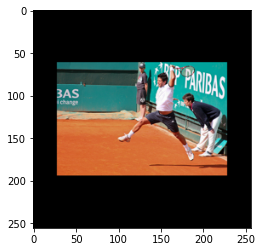

In [ ]:
# can be used to convert lab to rgb effectively
img_array = np.load('/content/small_dataset/val/000000006593.npy')
end = color.lab2rgb(img_array)*255
end = end.astype(np.uint8)
end = Image.fromarray(end, "RGB")
end = plt.imshow(end)

print(img_array.shape)

In [ ]:
# Save a copy of the small dataset so you dont have to repeat all of the above everytime
!zip -r /content/small_dataset.zip /content/small_dataset
from google.colab import files
files.download("/content/small_dataset.zip")

In [ ]:
# DELETE SMALL DATASET
!rm -r /content/small_dataset/

#Data preprocessing

Since coco images are 640 x 480, we resize with padding to make size 640 x 640, before downsizing to 128 x 128.

In [ ]:
## Trainer Helper - for saving data
def get_model_name(batch_size, learning_rate, epoch):
    path = "bs{}_lr{}_epoch{}".format(batch_size, learning_rate, epoch)
    return path

class AverageMeter(object):
  '''A handy class from the PyTorch ImageNet tutorial''' 
  def __init__(self):
    self.reset()
  def reset(self):
    self.val, self.avg, self.sum, self.count = 0, 0, 0, 0
  def update(self, val, n=1):
    self.val = val
    self.sum += val * n
    self.count += n
    self.avg = self.sum / self.count

def to_rgb(grayscale_input, ab_input, save_path=None, save_name=None):
  img_array = np.zeros((256, 256, 3))
  img_array[:,:,0] = np.squeeze( np.swapaxes(grayscale_input, 0, 1) )
  img_array[:,:,1:] = np.swapaxes( np.swapaxes(ab_input, 0, 2), 0, 1 )

  colour = color.lab2rgb(img_array)*255
  end = colour.astype(np.uint8)
  end = Image.fromarray(end, "RGB")
  plt.imshow(end)
  plt.show()

  # Showing BW Image
  presentable_bw = np.repeat( np.expand_dims(color.rgb2gray(colour/255.0), axis=2), 3, axis=2 )
  plt.imshow(presentable_bw)
  plt.show()

  # TODO: Fix Saving the file
  #if save_path is not None and save_name is not None: 
    #presentable_bw = np.repeat( np.expand_dims(color.rgb2gray(colour/255.0), axis=2), 3, axis=2 )
    #plt.imsave(arr=presentable_bw, fname='{}{}'.format(save_path['grayscale'], save_name))
    #plt.imsave(arr=end, fname='{}{}'.format(save_path['colorized'], save_name))

In [ ]:
def split_data(data_path, batch_size=1) :
  # Training
  train_transforms = transforms.Compose([])#transforms.Compose([transforms.Resize(128)])
  train_imagefolder = MockData(data_path + '/train', train_transforms)
  train_loader = torch.utils.data.DataLoader(train_imagefolder, batch_size=batch_size, shuffle=False)

  # Validation 
  val_transforms = transforms.Compose([])
  val_imagefolder = MockData(data_path + '/val' , val_transforms)
  val_loader = torch.utils.data.DataLoader(val_imagefolder, batch_size=batch_size, shuffle=False)
  return train_loader, val_loader

In [ ]:
## MOCK Dataloader ##
## Resources: 
# https://towardsdatascience.com/dataloader-for-sequential-data-using-pytorch-deep-learning-framework-part-2-ed3ad5f6ad82
# https://medium.com/analytics-vidhya/writing-a-custom-dataloader-for-a-simple-neural-network-in-pytorch-a310bea680af
# https://blog.paperspace.com/dataloaders-abstractions-pytorch/
import torch.nn.functional as F
class MockData(torch.utils.data.Dataset):   
   def __init__(self, path, transforms):
      super(torch.utils.data.Dataset, self).__init__()
      self.input_files = os.listdir(path) # e.g. content/small_dataset/train
      self.transform = transforms
      self.path = path
   def __len__(self):
        return len(self.input_files)
   def __getitem__(self, index):
       input_filename = self.input_files[index]
       ''' Code before we saved lab images
       print(input_filename)
       image = Image.open(os.path.join(self.path, input_filename))

       image = transforms.ToTensor()(image)
       #print(self.input_files[index], image.shape)

       image =  transforms.Resize((128, 128))(image)
       image = torch.swapaxes( torch.swapaxes(image, 0, 2), 0, 1)
       image = color.rgb2lab(1.0/255*image)
       image = torch.swapaxes(torch.from_numpy(image), 0, 2)

       image_bw = image[0,:,:]
       image_bw = torch.unsqueeze( image_bw, 0)
       label = image[1:,:,:]
       label /= 128

       #print(image_bw)
       #print(label)
       '''

       image = np.load(os.path.join(self.path, input_filename))

       image_bw = image[:,:,0]
       label = image[:,:,1:]

       image_bw = image_bw.reshape(1, 256, 256)
       label = np.swapaxes( np.swapaxes(label, 0, 2 ), 2, 1)

       image_bw = torch.from_numpy(image_bw).float()
       label = torch.from_numpy(label).float()

       return image_bw, label 



torch.Size([1, 1, 256, 256])
torch.Size([1, 2, 256, 256])




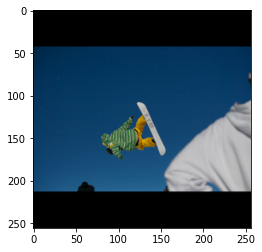

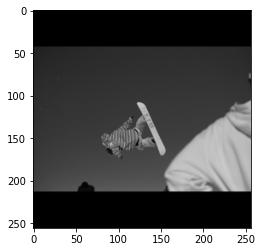

In [ ]:

############ Testing ####################
train_loader, val_loader = split_data('/content/small_dataset', 1)

print(train_loader)

for inputs, labels in train_loader:
  print('\n')
  print(inputs.shape)
  print(labels.shape)
  print('\n')

  to_rgb(inputs[0], labels[0])
  break

In [ ]:
### Needed omly when above fails ##########

path = "/content/small_dataset" + "/test"
# Remove any partially unzipped file
input_filenames = os.listdir(path)
for filename in input_filenames :
  image = Image.open(os.path.join(path, filename))
  image = transforms.ToTensor()(image)
  if image.shape[0] != 3:
    print("Deleted image with shape: " + str(image.shape))
    os.remove(os.path.join(path, filename)) 

Deleted image with shape: torch.Size([1, 436, 640])


#Model and Training

In [ ]:
class colorizer(nn.Module):
  def __init__(self):
    self.name = "colorizer"
    super(colorizer, self).__init__()
    self.Conv0 = nn.Sequential(
    nn.Conv2d(1, 32, 3, padding = 'same'), # 128 * 128 * 32
    nn.ReLU(),
    nn.BatchNorm2d(32)
    )
    self.Conv1 = nn.Sequential(
    nn.Conv2d(32, 64, 3, stride = 2, padding = 1), # 64*64*64
    nn.ReLU(),
    nn.BatchNorm2d(64)
    )
    self.Conv2 = nn.Sequential(
    nn.Conv2d(64, 128, 2, padding = 'same'), # 64 * 64 * 128
    nn.ReLU(),
    nn.BatchNorm2d(128)
    )
    self.Conv3 = nn.Sequential(
    nn.Conv2d(128, 256, 2, stride = 2, padding = 0), # 32 * 32 * 256
    nn.ReLU(),
    nn.BatchNorm2d(256)
    )
    self.Conv4 = nn.Sequential(
    nn.Conv2d(256, 512, 2, padding = 'same'), # 32 * 32 * 512
    nn.ReLU(),
    nn.BatchNorm2d(512)
    )
    self.Conv5 = nn.Sequential(
    nn.Conv2d(512, 512, 2, padding = 'same'), # 32 * 32 * 512
    nn.ReLU(),
    nn.BatchNorm2d(512)
    )
    self.Conv5 = nn.Sequential(
    nn.Conv2d(512, 256, 2, padding = 'same'), # 32 * 32 * 256
    nn.ReLU(),
    nn.BatchNorm2d(256)
    )
    self.Conv6 = nn.Sequential(
    nn.Upsample(scale_factor=2),
    nn.Conv2d(256, 128, 2, padding = 'same'), # 64 * 64 * 128
    nn.ReLU(),
    nn.BatchNorm2d(128)
    )
    """self.Conv6 = nn.Sequential(
    nn.ConvTranspose2d(256, 128, 2, output_padding = 32), # 64 * 64 * 128
    nn.ReLU(),
    nn.BatchNorm2d(128)
    )"""
    self.Conv7 = nn.Sequential(
    nn.Conv2d(128, 64, 2, padding = 'same'), # 64 * 64 * 64
    nn.ReLU(),
    nn.BatchNorm2d(64)
    )
    self.Conv8 = nn.Sequential(
    nn.Upsample(scale_factor=2),
    nn.Conv2d(64, 32, 2, padding = 'same'), # 128*128*32
    nn.ReLU(),
    nn.BatchNorm2d(32)
    )
    """self.Conv8 = nn.Sequential(
    nn.ConvTranspose2d(64, 32, 2, output_padding = 64), # 128 * 128 * 32
    nn.ReLU(),
    nn.BatchNorm2d(64)"""
    
    self.Conv9 = nn.Sequential(
    nn.Conv2d(32, 2, 2, padding = 'same') # 128 * 128 * 2
    )
    

  def forward(self, x):
    x = self.Conv0(x)
    x = self.Conv1(x)
    x = self.Conv2(x)
    x = self.Conv3(x)
    x = self.Conv4(x)
    x = self.Conv5(x)
    x = self.Conv6(x)
    x = self.Conv7(x)
    x = self.Conv8(x)
    x = self.Conv9(x)
    return x


In [ ]:
# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
def get_accuracy(model, val_loader, criterion, model_path, epoch, save_images):   
  model.eval()
  losses = AverageMeter()
  with torch.no_grad():
    for i, (input_gray, input_ab) in enumerate(val_loader):
      input_gray, input_ab = input_gray.cuda(), input_ab.cuda()
      output_ab = model(input_gray)
      loss = criterion (output_ab,input_ab)
      losses.update(loss.item(), input_gray.size(0))
      if save_images:
        for j in range(min(len(output_ab), 5)): # save at most 5 images
            save_path = {'grayscale': str(model_path) + 'outputs/gray/', 'colorized': str(model_path)+'outputs/color/'}
            save_name = 'img-{}-epoch-{}.jpg'.format(j, epoch)
            to_rgb(input_gray[j].cpu(), ab_input=output_ab[j].detach().cpu(), save_path=save_path, save_name=save_name)
  return losses.avg

In [ ]:
def train(model, dataset_path, learning_rate=0.01, batch_size=64, num_epochs=1):
    model = model.to(device)
    train_loader, val_loader = split_data(dataset_path, batch_size)
    criterion = nn.MSELoss().to(device) # Alternatives, PSNR, PA (https://core.ac.uk/download/pdf/151072499.pdf) 
    optimizer = optim.Adam(model.parameters(), lr = learning_rate)

    iters, train_losses, val_losses = [], [], []
    #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.7, verbose= True, min_lr=1e-6)
    model_name = get_model_name(batch_size, learning_rate, num_epochs) 
    model_path = os.path.join("/content/backup", model_name)
    os.makedirs(model_path, exist_ok=True)

    start_time = time.time() 

    # training
    n = 0 # the number of iterations
    for epoch in range(num_epochs):
      model.train()
      for i, (bw_images,labels) in enumerate(train_loader):
        bw_images = bw_images.cuda()
        labels = labels.cuda()
        logits = model(bw_images)

        #print("DEEZ")
        #to_rgb(bw_images.cpu()[0], labels.cpu()[0])
        #print("logits shape = " + str(logits.shape)) >> [batch_size, 2, 128, 128]

        loss = criterion(logits, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

      # Display a few images before and after for each epoch
      if epoch % 2 == 0:
        iters.append(epoch)
        train_losses.append(float(loss))  
        val_losses.append(float(get_accuracy(model, val_loader,criterion, model_path, epoch, True)))  # compute validation accuracy
        print("Epoch [{}/{}], Loss: {:.4f}, Training losses: {:.4f}, Validation losses: {:.4f}".format(epoch+1,num_epochs,loss,train_losses[-1],val_losses[-1]))
        #scheduler.step(val_acc[-1])
        try: 
          if val_losses[-1]==min(val_losses): #model saved if performance is better 
            torch.save(model.state_dict(), model_path + "/" + "best")
            print("best model saved at epoch {}".format(epoch+1))
        except:
          continue
      if epoch%20 == 0: #model checkpoint every 20 epochs
        torch.save(model.state_dict(), model_path + "/" + get_model_name(batch_size, learning_rate, epoch))
        print ("checkpoint saved at epoch {}".format(epoch+1)) 
    
    print("Total time taken: {}".format(time.time() - start_time))   
  
    # plotting
    plt.title("Training Curve")
    plt.plot(iters, train_losses, label="Train")
    plt.plot(iters, val_losses, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()
    plt.savefig(str(model_path) + '/training curve.png')


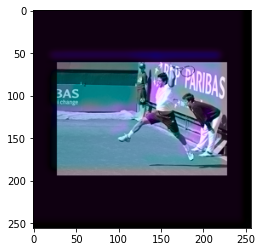

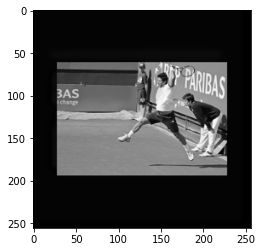

Epoch [1/200], Loss: 129.0975, Training losses: 129.0975, Validation losses: 773.9407
best model saved at epoch 1
checkpoint saved at epoch 1


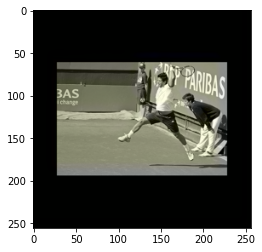

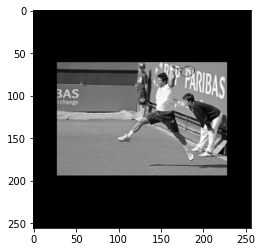

Epoch [3/200], Loss: 129.7418, Training losses: 129.7418, Validation losses: 318.6249
best model saved at epoch 3


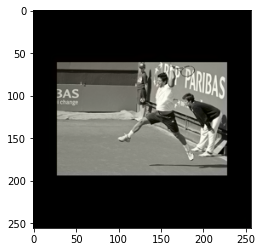

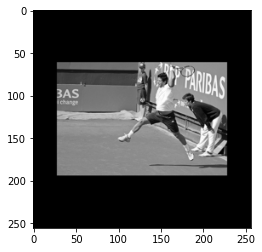

Epoch [5/200], Loss: 130.7773, Training losses: 130.7773, Validation losses: 334.6924


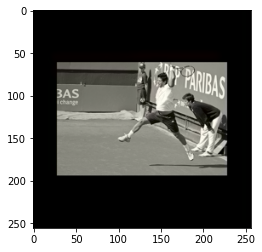

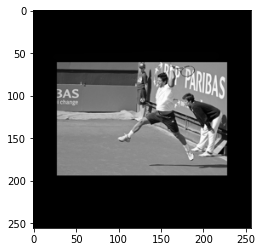

Epoch [7/200], Loss: 131.2676, Training losses: 131.2676, Validation losses: 329.9755


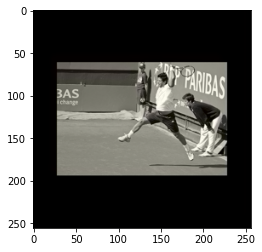

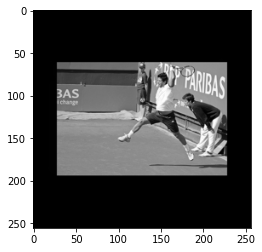

Epoch [9/200], Loss: 130.7083, Training losses: 130.7083, Validation losses: 324.5461


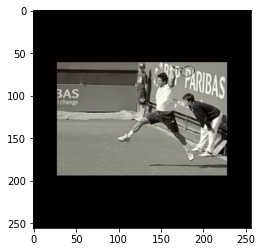

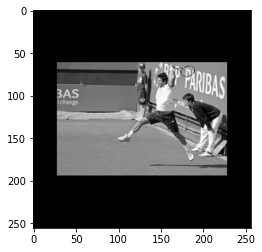

Epoch [11/200], Loss: 129.2612, Training losses: 129.2612, Validation losses: 329.2101


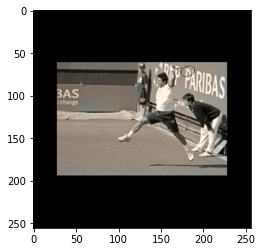

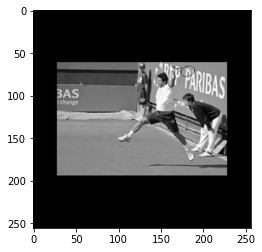

Epoch [13/200], Loss: 131.6987, Training losses: 131.6987, Validation losses: 306.5468
best model saved at epoch 13


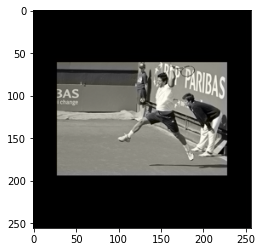

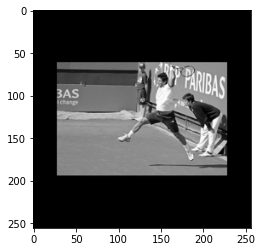

Epoch [15/200], Loss: 128.5305, Training losses: 128.5305, Validation losses: 328.2794


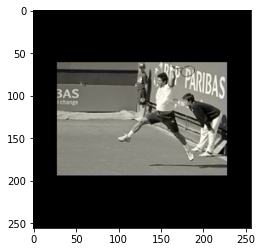

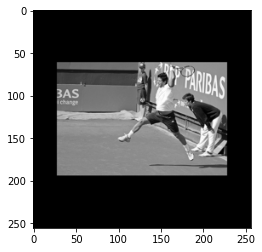

Epoch [17/200], Loss: 127.1160, Training losses: 127.1160, Validation losses: 327.2788


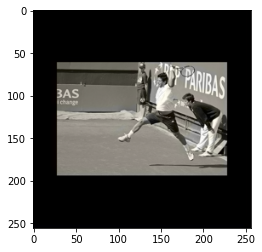

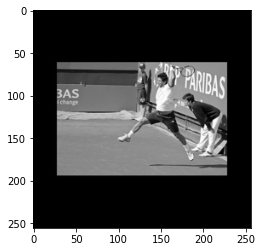

Epoch [19/200], Loss: 125.5994, Training losses: 125.5994, Validation losses: 320.3527


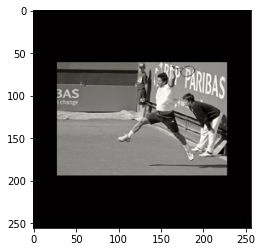

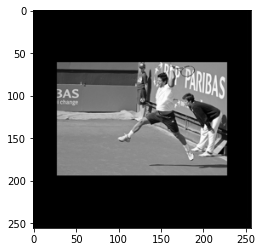

Epoch [21/200], Loss: 128.4062, Training losses: 128.4062, Validation losses: 340.2525
checkpoint saved at epoch 21


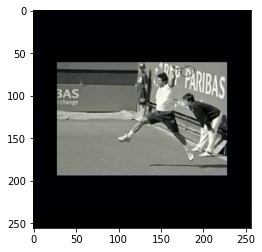

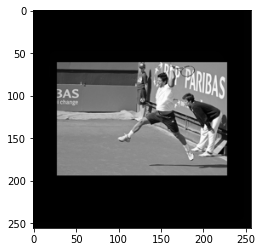

Epoch [23/200], Loss: 133.8337, Training losses: 133.8337, Validation losses: 339.5228


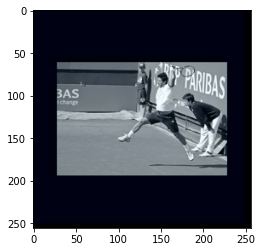

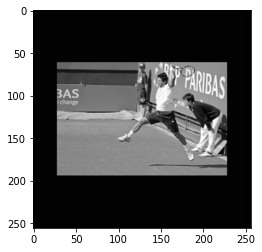

Epoch [25/200], Loss: 145.5876, Training losses: 145.5876, Validation losses: 419.8329


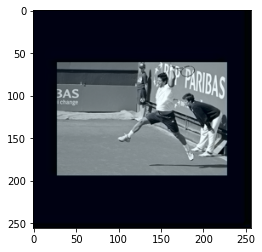

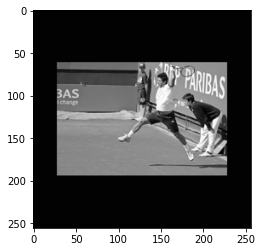

Epoch [27/200], Loss: 149.6137, Training losses: 149.6137, Validation losses: 412.8076


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 415 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


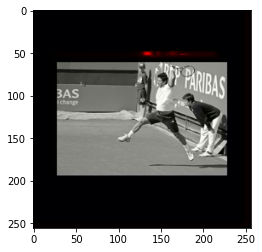

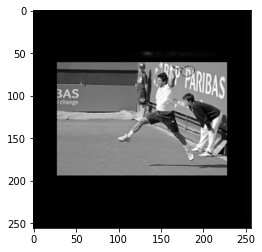

Epoch [29/200], Loss: 131.4263, Training losses: 131.4263, Validation losses: 540.9763


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 19 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


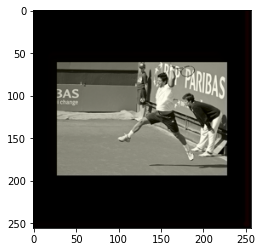

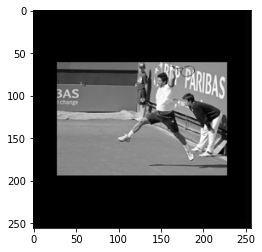

Epoch [31/200], Loss: 135.8702, Training losses: 135.8702, Validation losses: 327.3194


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


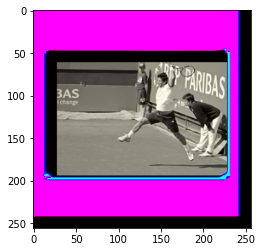

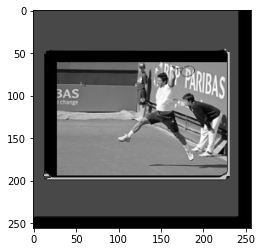

Epoch [33/200], Loss: 141.8015, Training losses: 141.8015, Validation losses: 4225984.0000


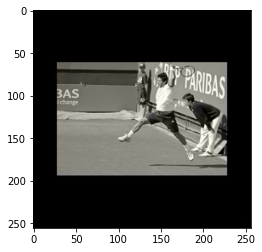

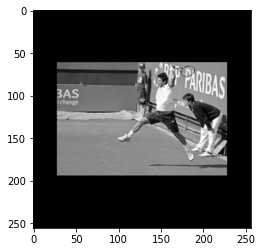

Epoch [35/200], Loss: 129.6146, Training losses: 129.6146, Validation losses: 326.1689


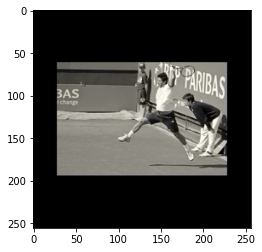

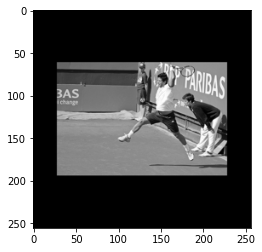

Epoch [37/200], Loss: 127.7043, Training losses: 127.7043, Validation losses: 324.9146


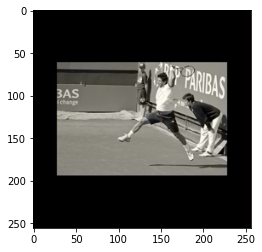

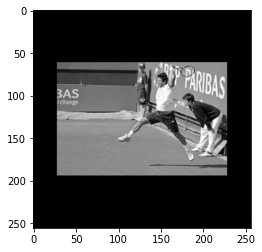

Epoch [39/200], Loss: 126.9959, Training losses: 126.9959, Validation losses: 324.5051


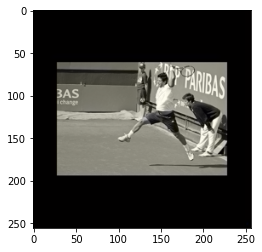

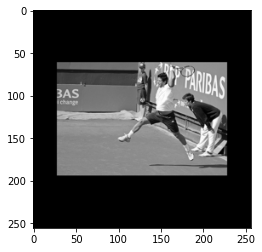

Epoch [41/200], Loss: 127.2685, Training losses: 127.2685, Validation losses: 319.7917
checkpoint saved at epoch 41


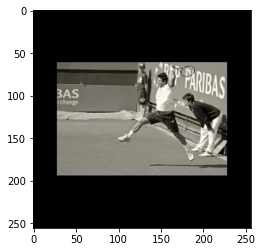

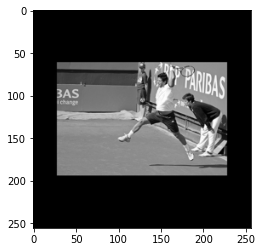

Epoch [43/200], Loss: 125.8379, Training losses: 125.8379, Validation losses: 323.2919


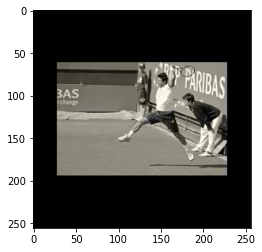

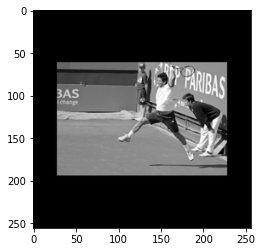

Epoch [45/200], Loss: 124.7544, Training losses: 124.7544, Validation losses: 314.7860


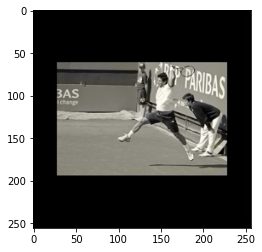

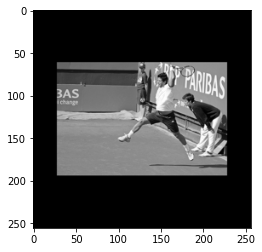

Epoch [47/200], Loss: 133.3981, Training losses: 133.3981, Validation losses: 320.0125


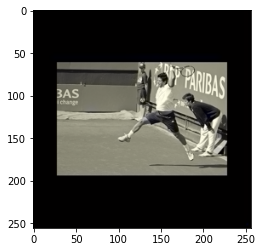

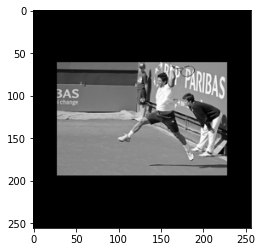

Epoch [49/200], Loss: 138.4974, Training losses: 138.4974, Validation losses: 308.3550


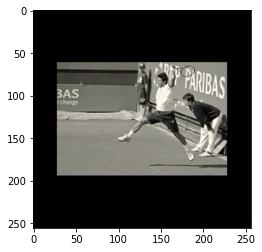

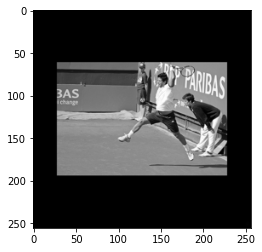

Epoch [51/200], Loss: 130.8410, Training losses: 130.8410, Validation losses: 323.4176


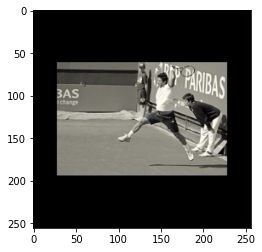

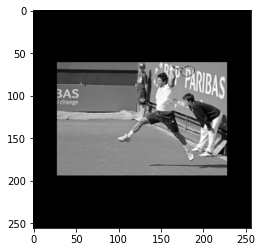

Epoch [53/200], Loss: 128.0765, Training losses: 128.0765, Validation losses: 322.1437


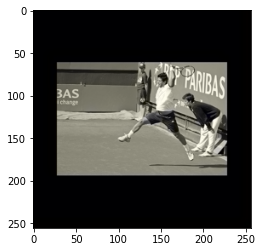

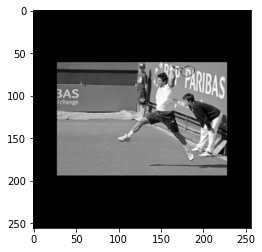

Epoch [55/200], Loss: 125.4474, Training losses: 125.4474, Validation losses: 313.3370


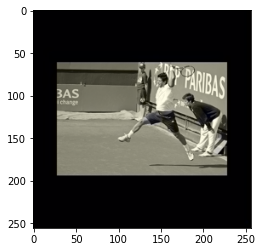

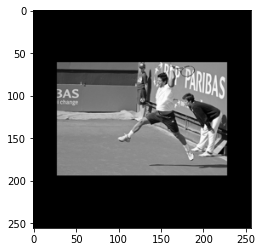

Epoch [57/200], Loss: 128.5551, Training losses: 128.5551, Validation losses: 310.4319


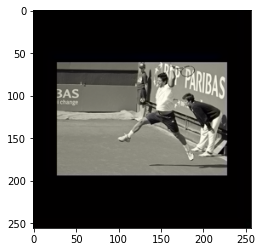

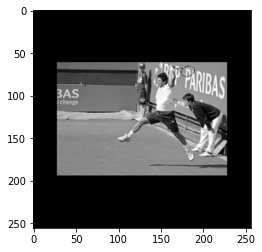

Epoch [59/200], Loss: 131.9579, Training losses: 131.9579, Validation losses: 321.5677


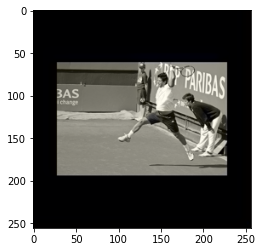

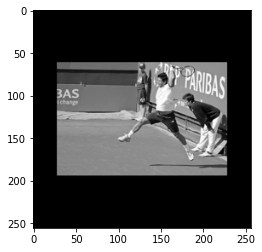

Epoch [61/200], Loss: 124.4273, Training losses: 124.4273, Validation losses: 323.2062
checkpoint saved at epoch 61


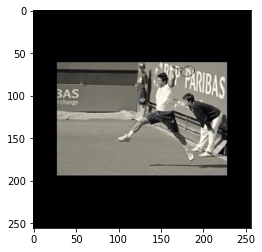

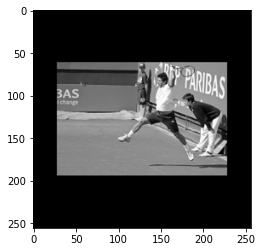

Epoch [63/200], Loss: 128.3487, Training losses: 128.3487, Validation losses: 317.7198


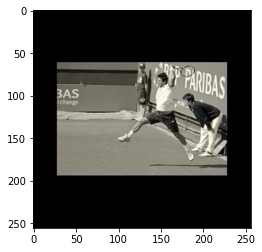

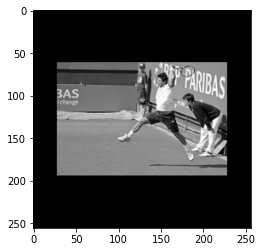

Epoch [65/200], Loss: 129.2739, Training losses: 129.2739, Validation losses: 317.7108


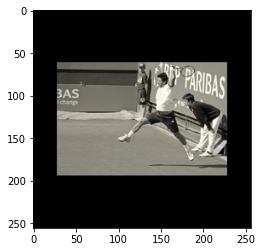

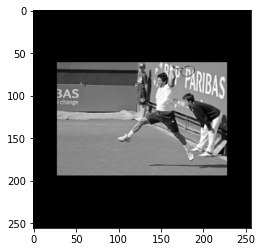

Epoch [67/200], Loss: 124.9174, Training losses: 124.9174, Validation losses: 316.9235


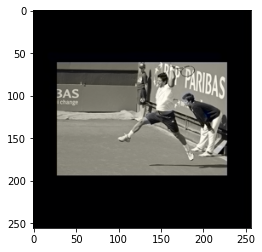

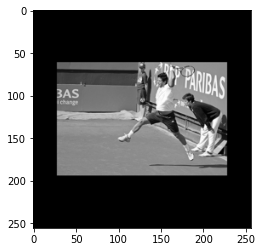

Epoch [69/200], Loss: 127.3994, Training losses: 127.3994, Validation losses: 319.2661


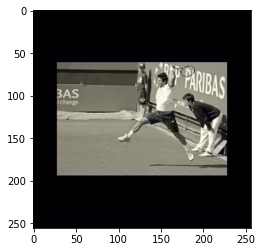

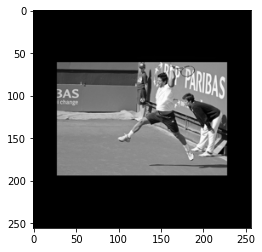

Epoch [71/200], Loss: 125.9789, Training losses: 125.9789, Validation losses: 313.2024


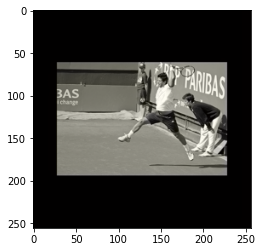

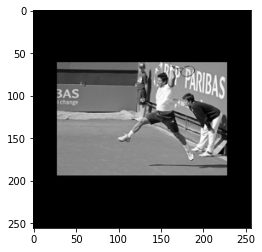

Epoch [73/200], Loss: 130.4906, Training losses: 130.4906, Validation losses: 323.4300


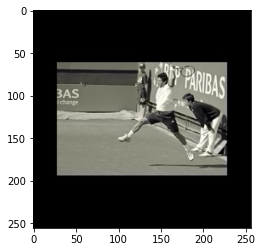

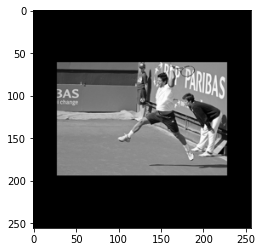

Epoch [75/200], Loss: 127.5140, Training losses: 127.5140, Validation losses: 315.7524


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 38 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


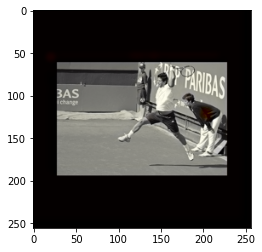

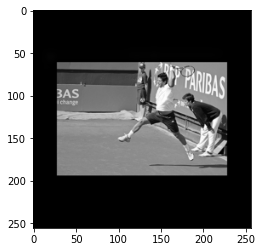

Epoch [77/200], Loss: 135.4782, Training losses: 135.4782, Validation losses: 336.3577


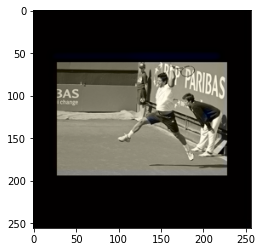

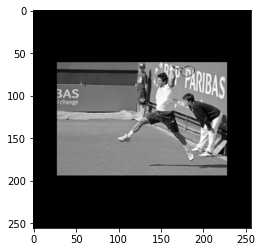

Epoch [79/200], Loss: 121.0989, Training losses: 121.0989, Validation losses: 314.6949


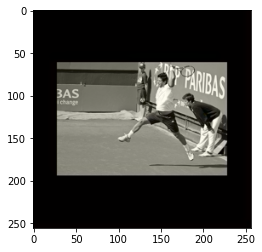

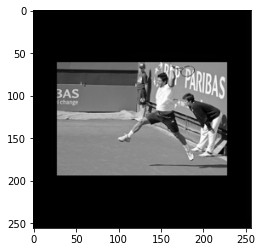

Epoch [81/200], Loss: 125.9096, Training losses: 125.9096, Validation losses: 323.8587
checkpoint saved at epoch 81


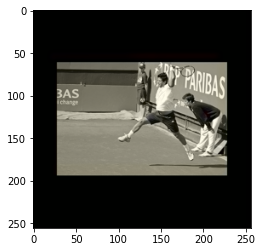

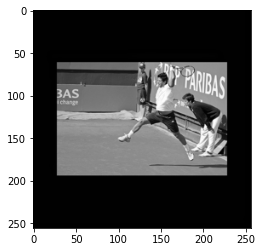

Epoch [83/200], Loss: 130.4273, Training losses: 130.4273, Validation losses: 314.4532


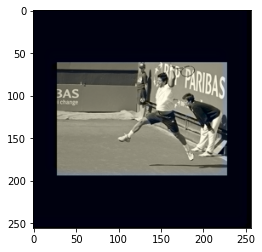

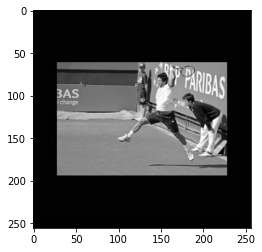

Epoch [85/200], Loss: 130.0082, Training losses: 130.0082, Validation losses: 329.9758


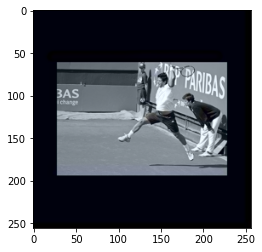

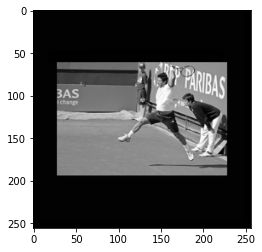

Epoch [87/200], Loss: 139.7641, Training losses: 139.7641, Validation losses: 420.6850


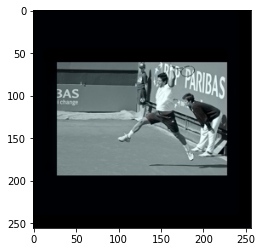

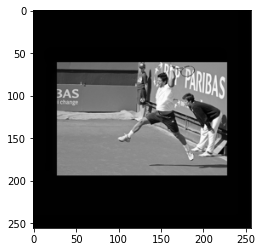

Epoch [89/200], Loss: 143.7879, Training losses: 143.7879, Validation losses: 397.0475


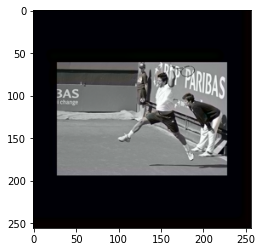

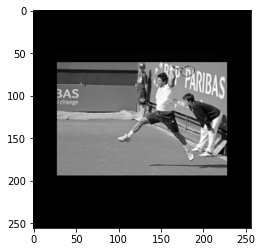

Epoch [91/200], Loss: 129.7451, Training losses: 129.7451, Validation losses: 367.0186


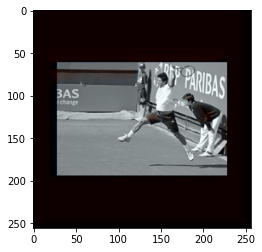

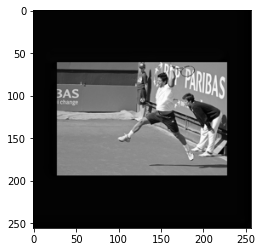

Epoch [93/200], Loss: 141.4917, Training losses: 141.4917, Validation losses: 388.4980


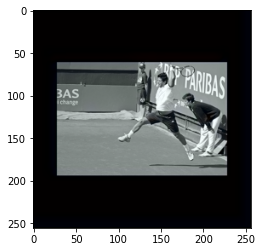

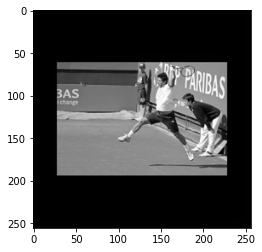

Epoch [95/200], Loss: 133.6528, Training losses: 133.6528, Validation losses: 369.0962


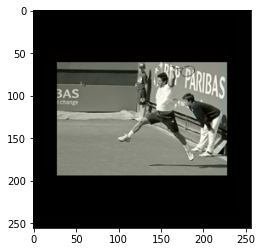

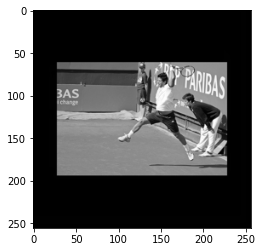

Epoch [97/200], Loss: 134.5081, Training losses: 134.5081, Validation losses: 336.5472


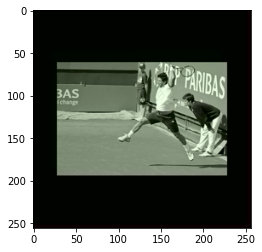

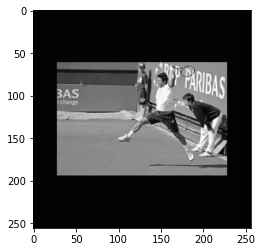

Epoch [99/200], Loss: 137.3965, Training losses: 137.3965, Validation losses: 372.9124


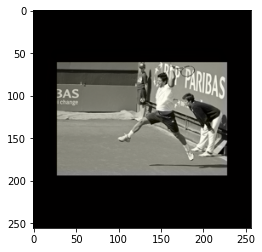

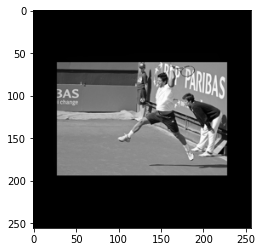

Epoch [101/200], Loss: 130.7362, Training losses: 130.7362, Validation losses: 326.9202
checkpoint saved at epoch 101


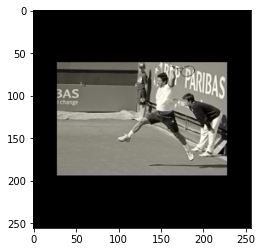

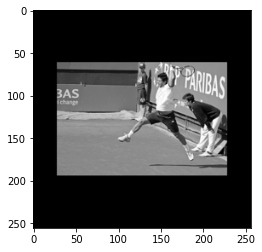

Epoch [103/200], Loss: 127.9164, Training losses: 127.9164, Validation losses: 322.9792


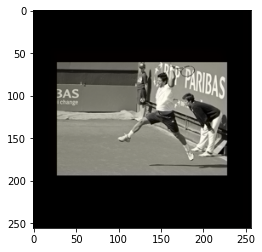

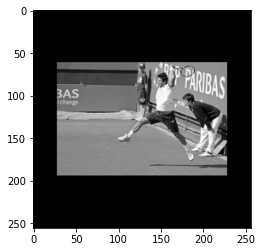

Epoch [105/200], Loss: 127.3540, Training losses: 127.3540, Validation losses: 323.3649


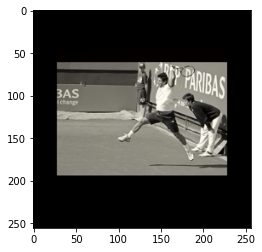

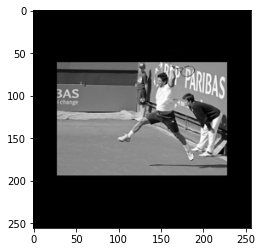

Epoch [107/200], Loss: 127.1426, Training losses: 127.1426, Validation losses: 322.4401


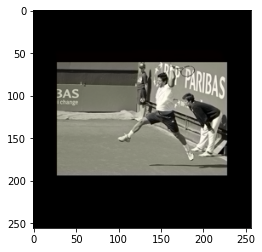

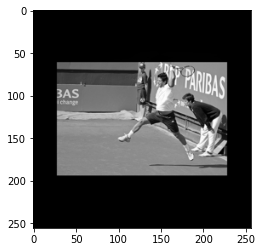

Epoch [109/200], Loss: 126.2065, Training losses: 126.2065, Validation losses: 318.9147


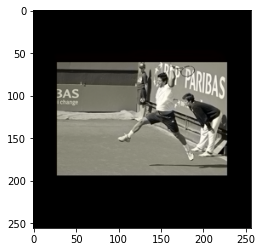

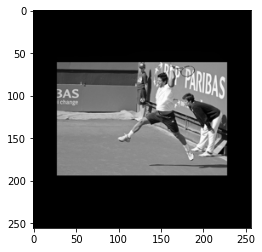

Epoch [111/200], Loss: 125.9422, Training losses: 125.9422, Validation losses: 315.5079


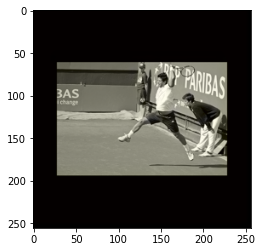

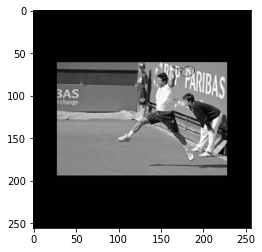

Epoch [113/200], Loss: 130.3865, Training losses: 130.3865, Validation losses: 335.6402


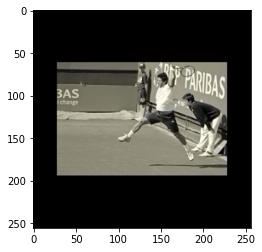

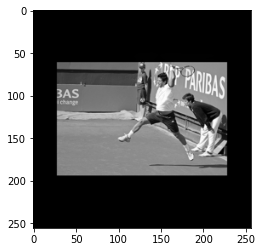

Epoch [115/200], Loss: 126.9760, Training losses: 126.9760, Validation losses: 305.9979
best model saved at epoch 115


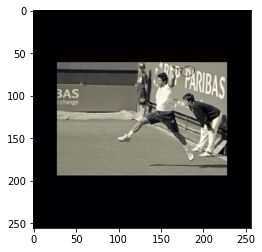

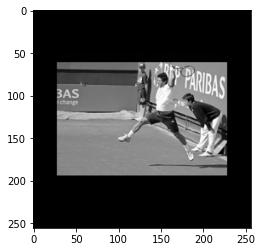

Epoch [117/200], Loss: 127.5031, Training losses: 127.5031, Validation losses: 313.0472


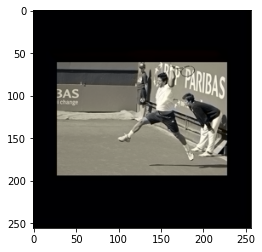

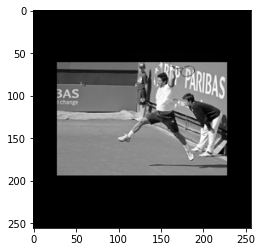

Epoch [119/200], Loss: 125.4977, Training losses: 125.4977, Validation losses: 306.1204


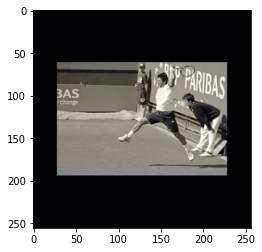

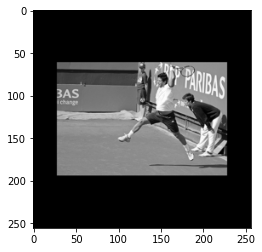

Epoch [121/200], Loss: 120.7152, Training losses: 120.7152, Validation losses: 322.4174
checkpoint saved at epoch 121


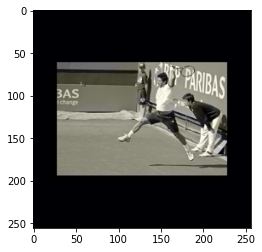

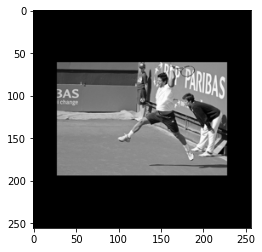

Epoch [123/200], Loss: 130.5039, Training losses: 130.5039, Validation losses: 313.9129


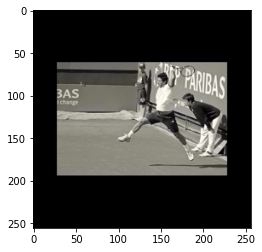

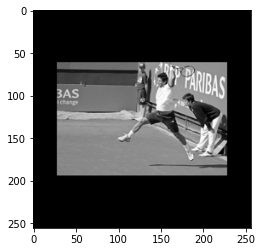

Epoch [125/200], Loss: 128.9043, Training losses: 128.9043, Validation losses: 320.5192


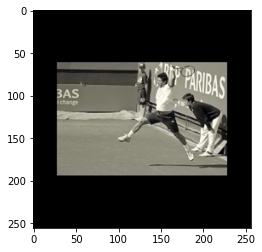

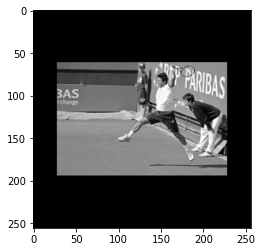

Epoch [127/200], Loss: 130.2091, Training losses: 130.2091, Validation losses: 313.2382


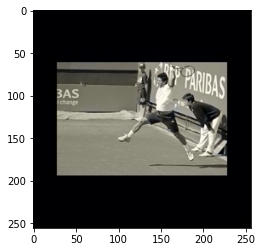

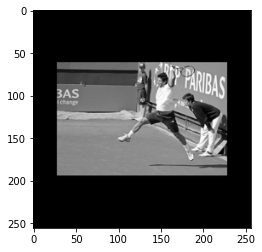

Epoch [129/200], Loss: 129.1093, Training losses: 129.1093, Validation losses: 310.5006


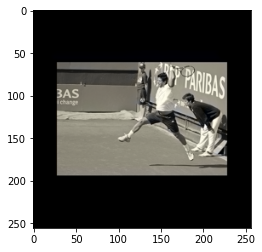

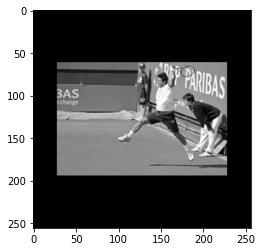

Epoch [131/200], Loss: 130.8639, Training losses: 130.8639, Validation losses: 309.6306


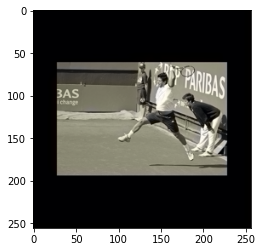

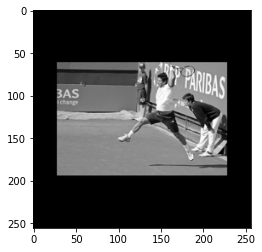

Epoch [133/200], Loss: 124.0071, Training losses: 124.0071, Validation losses: 305.9790
best model saved at epoch 133


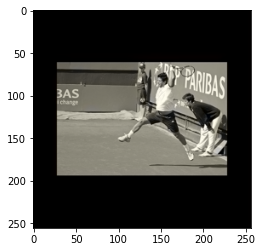

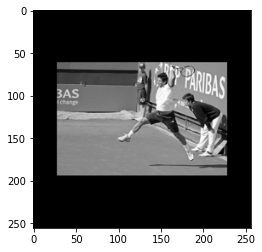

Epoch [135/200], Loss: 126.4988, Training losses: 126.4988, Validation losses: 313.8062


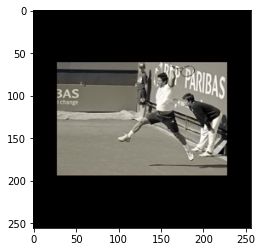

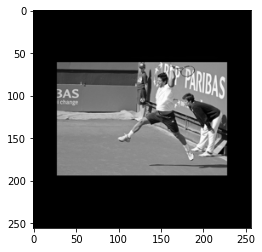

Epoch [137/200], Loss: 132.1727, Training losses: 132.1727, Validation losses: 310.5461


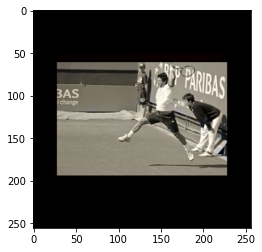

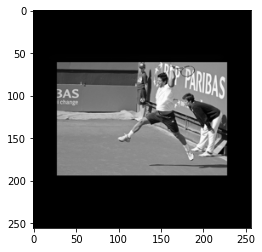

Epoch [139/200], Loss: 124.7176, Training losses: 124.7176, Validation losses: 303.5436
best model saved at epoch 139


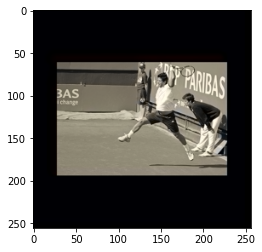

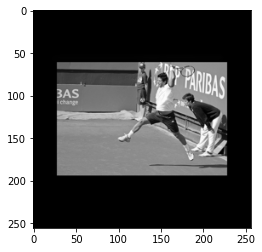

Epoch [141/200], Loss: 124.3668, Training losses: 124.3668, Validation losses: 300.0933
best model saved at epoch 141
checkpoint saved at epoch 141


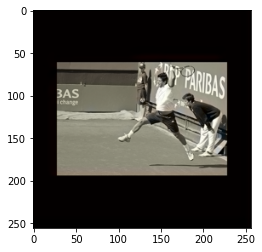

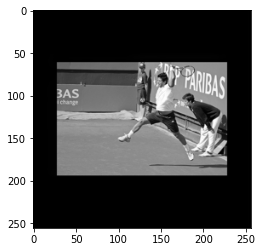

Epoch [143/200], Loss: 119.3734, Training losses: 119.3734, Validation losses: 308.9218


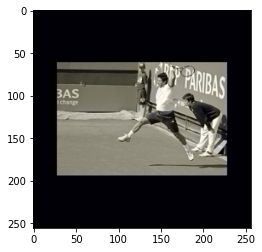

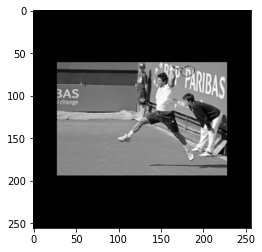

Epoch [145/200], Loss: 124.2135, Training losses: 124.2135, Validation losses: 315.6089


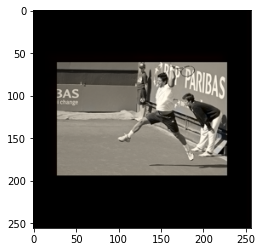

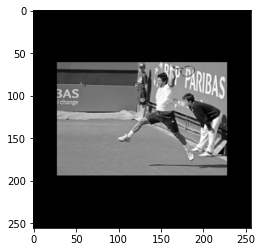

Epoch [147/200], Loss: 124.0882, Training losses: 124.0882, Validation losses: 310.1739


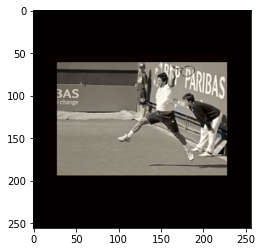

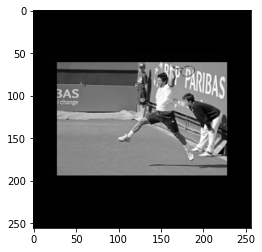

Epoch [149/200], Loss: 120.2329, Training losses: 120.2329, Validation losses: 310.5283


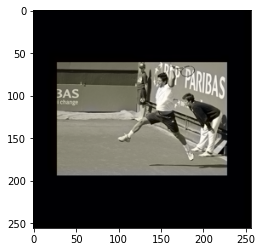

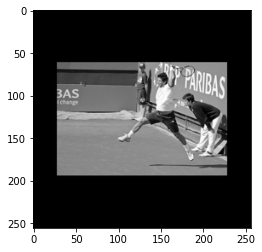

Epoch [151/200], Loss: 124.4377, Training losses: 124.4377, Validation losses: 316.1694


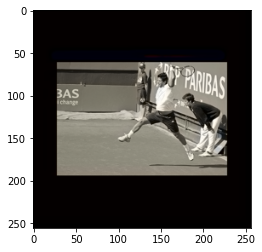

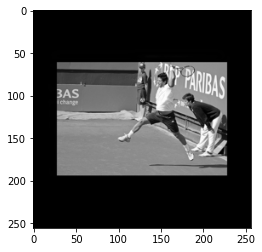

Epoch [153/200], Loss: 121.2312, Training losses: 121.2312, Validation losses: 314.6118


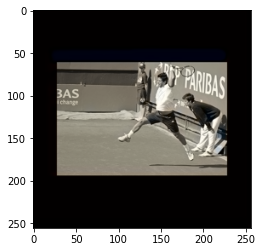

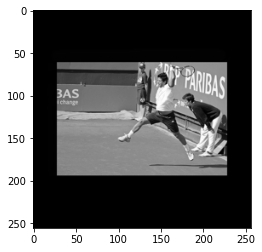

Epoch [155/200], Loss: 116.8582, Training losses: 116.8582, Validation losses: 306.6436


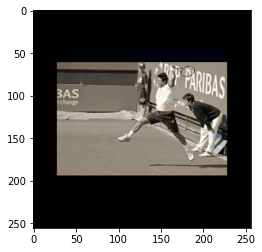

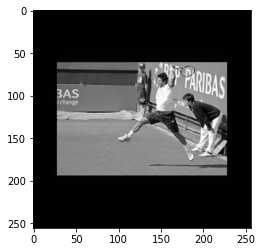

Epoch [157/200], Loss: 120.3239, Training losses: 120.3239, Validation losses: 301.3120


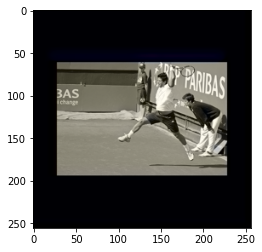

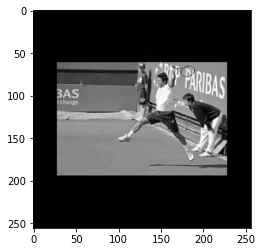

Epoch [159/200], Loss: 121.5085, Training losses: 121.5085, Validation losses: 315.2123


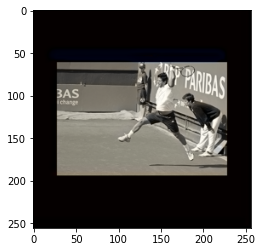

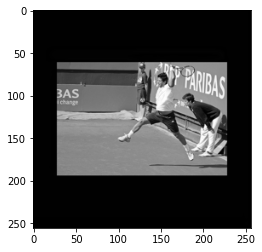

Epoch [161/200], Loss: 121.1326, Training losses: 121.1326, Validation losses: 314.4900
checkpoint saved at epoch 161


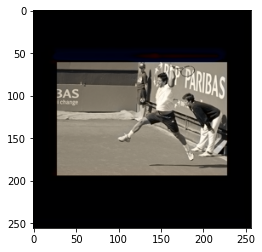

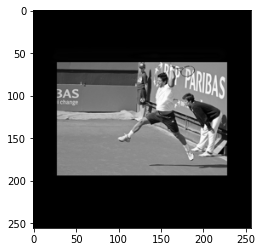

Epoch [163/200], Loss: 119.7308, Training losses: 119.7308, Validation losses: 296.9564
best model saved at epoch 163


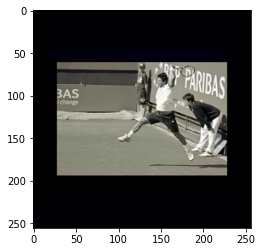

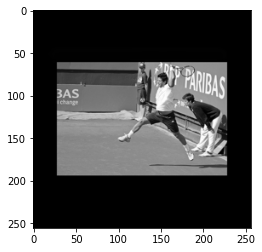

Epoch [165/200], Loss: 114.9349, Training losses: 114.9349, Validation losses: 317.4327


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 233 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


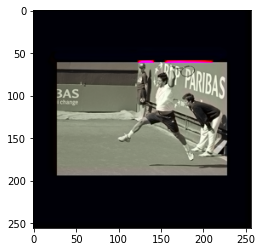

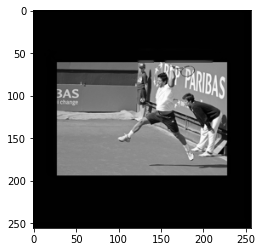

Epoch [167/200], Loss: 122.5270, Training losses: 122.5270, Validation losses: 2027.3623


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 468 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


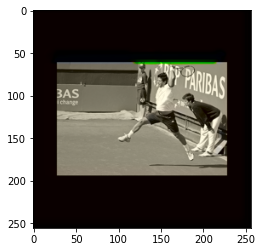

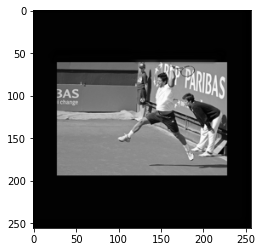

Epoch [169/200], Loss: 137.3379, Training losses: 137.3379, Validation losses: 458.6864


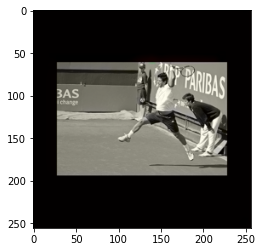

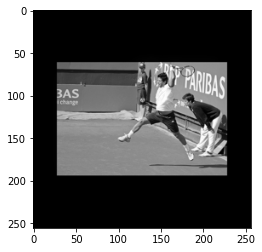

Epoch [171/200], Loss: 130.7303, Training losses: 130.7303, Validation losses: 320.0210


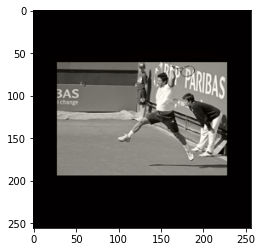

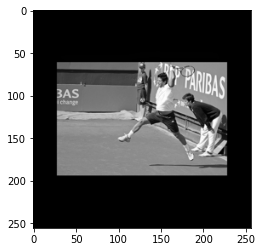

Epoch [173/200], Loss: 132.8932, Training losses: 132.8932, Validation losses: 335.1061


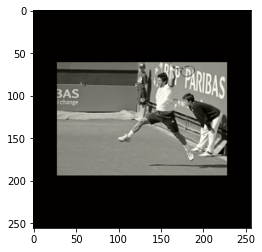

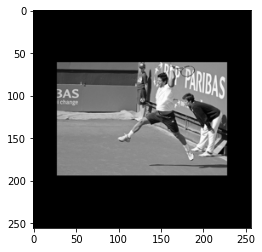

Epoch [175/200], Loss: 132.5388, Training losses: 132.5388, Validation losses: 334.4405


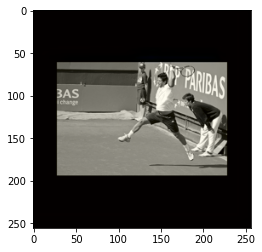

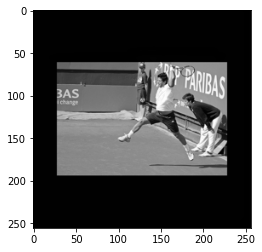

Epoch [177/200], Loss: 132.7832, Training losses: 132.7832, Validation losses: 333.1520


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 46 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


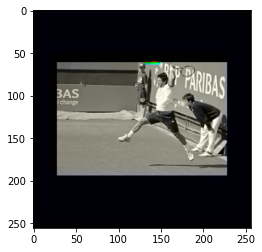

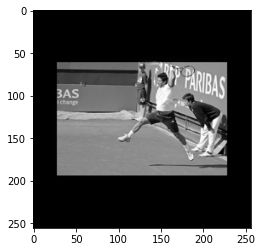

Epoch [179/200], Loss: 128.4883, Training losses: 128.4883, Validation losses: 1609.6357


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


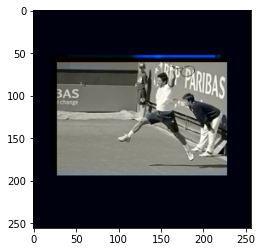

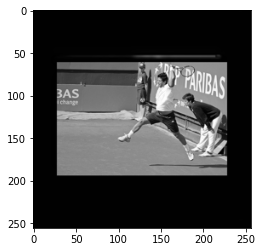

Epoch [181/200], Loss: 132.6524, Training losses: 132.6524, Validation losses: 416.1846
checkpoint saved at epoch 181


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


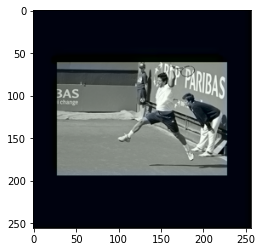

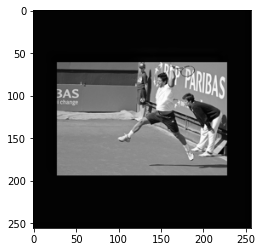

Epoch [183/200], Loss: 147.7375, Training losses: 147.7375, Validation losses: 370.4946


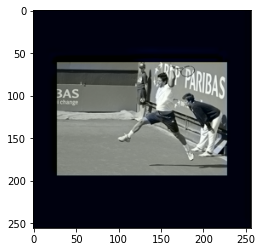

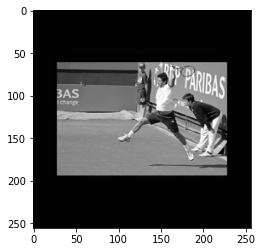

Epoch [185/200], Loss: 140.9842, Training losses: 140.9842, Validation losses: 358.1214


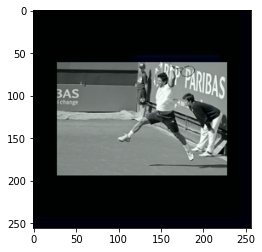

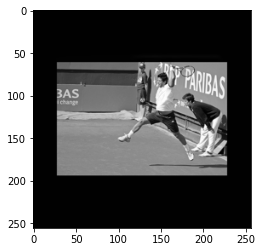

Epoch [187/200], Loss: 135.6450, Training losses: 135.6450, Validation losses: 365.0903


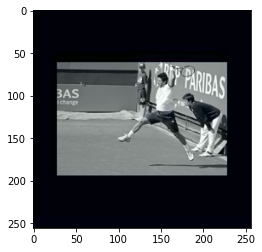

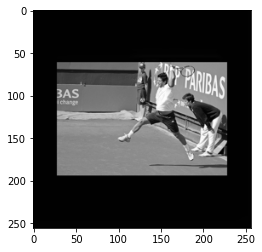

Epoch [189/200], Loss: 136.4599, Training losses: 136.4599, Validation losses: 371.7725


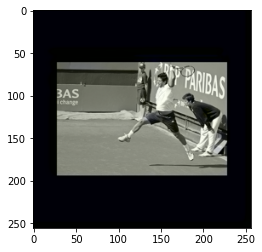

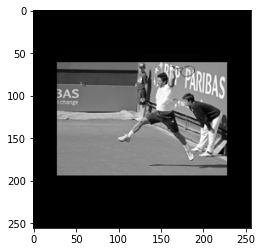

Epoch [191/200], Loss: 128.2709, Training losses: 128.2709, Validation losses: 331.7924


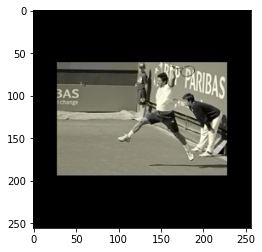

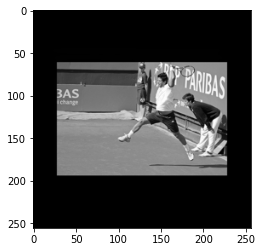

Epoch [193/200], Loss: 137.9863, Training losses: 137.9863, Validation losses: 309.6666


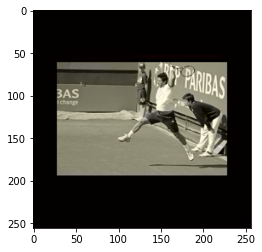

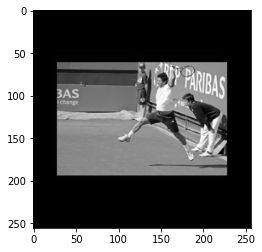

Epoch [195/200], Loss: 132.9828, Training losses: 132.9828, Validation losses: 311.8867


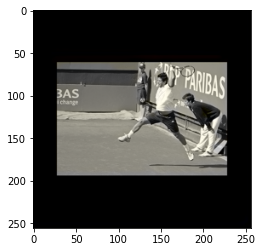

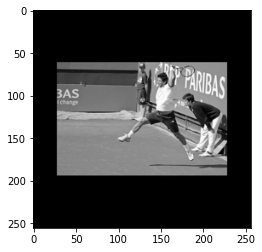

Epoch [197/200], Loss: 125.8749, Training losses: 125.8749, Validation losses: 324.0898


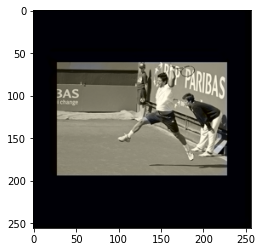

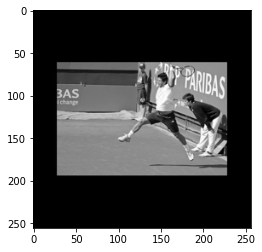

Epoch [199/200], Loss: 124.3911, Training losses: 124.3911, Validation losses: 306.2836
Total time taken: 253.0953667163849


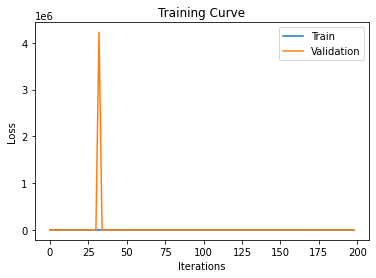

<Figure size 432x288 with 0 Axes>

In [ ]:
model = colorizer()

train(model, '/content/small_dataset', learning_rate=0.1, batch_size=1, num_epochs=200)

Attempt at Reconstruction


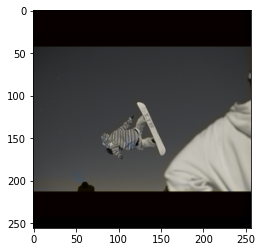

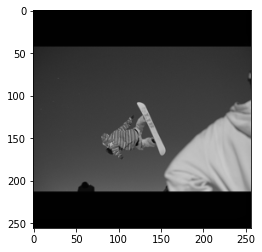

Original


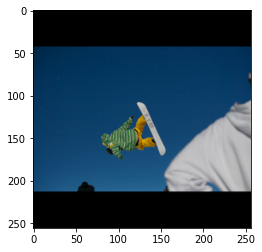

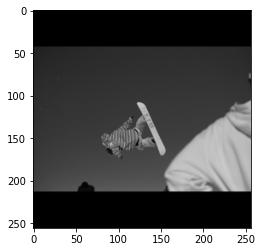

Attempt at Reconstruction


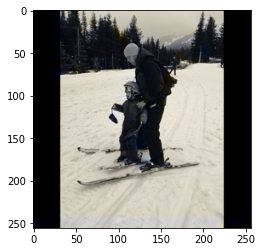

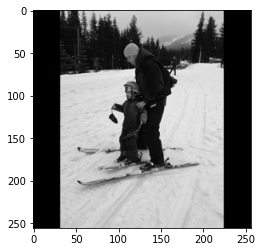

Original


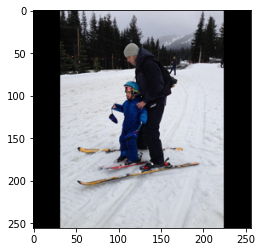

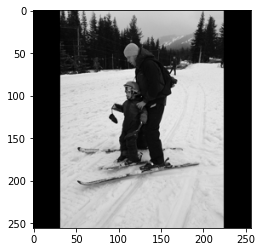

Attempt at Reconstruction


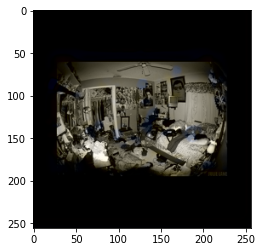

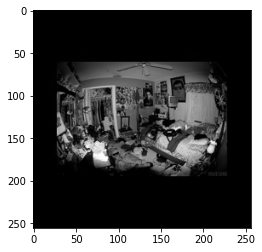

Original


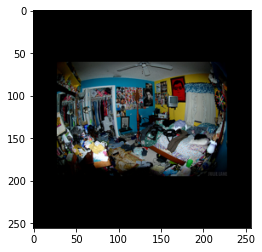

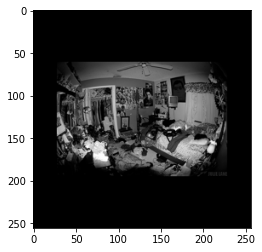

Attempt at Reconstruction


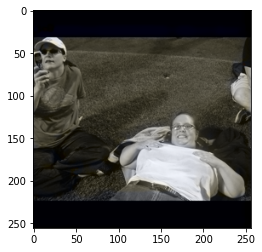

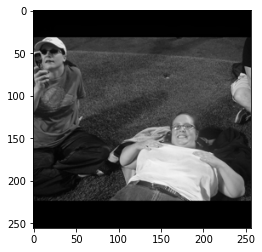

Original


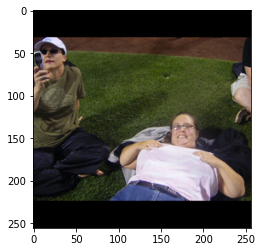

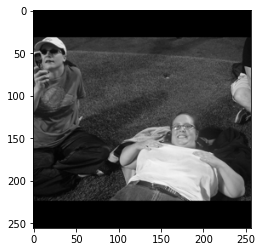

Attempt at Reconstruction


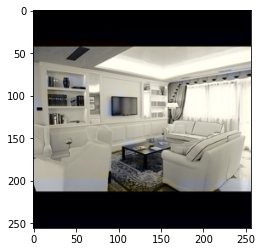

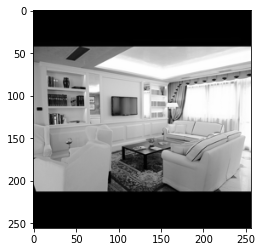

Original


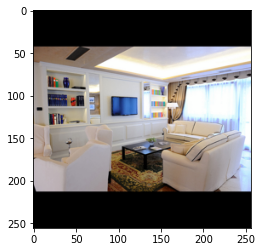

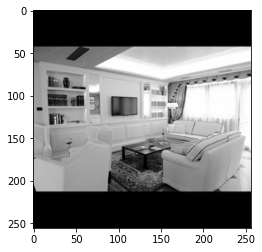

Attempt at Reconstruction


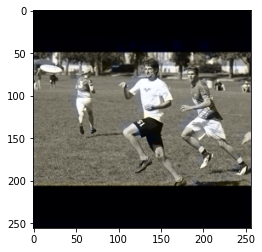

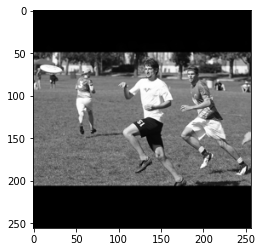

Original


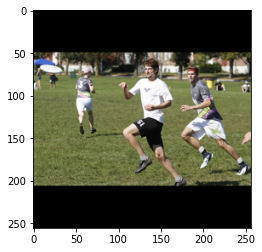

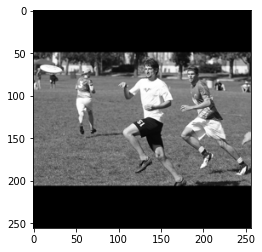

Attempt at Reconstruction


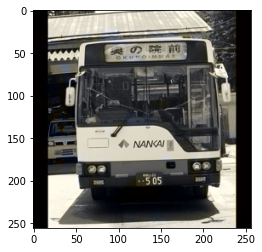

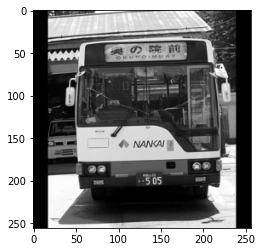

Original


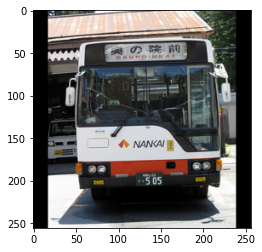

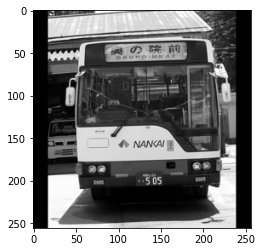

Attempt at Reconstruction


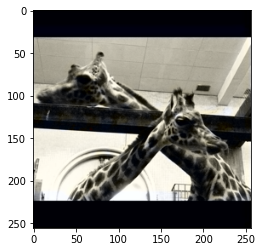

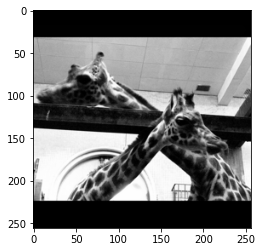

Original


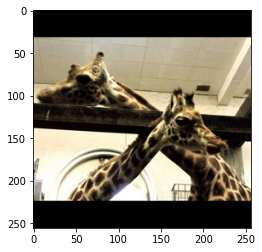

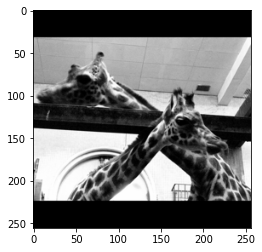

Attempt at Reconstruction


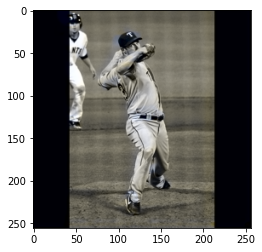

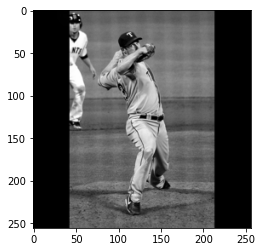

Original


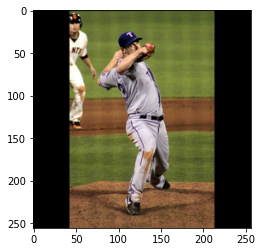

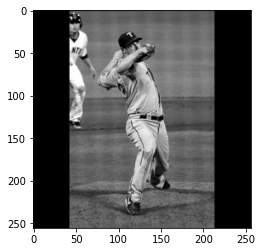

Attempt at Reconstruction


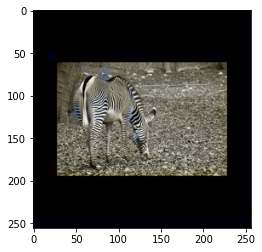

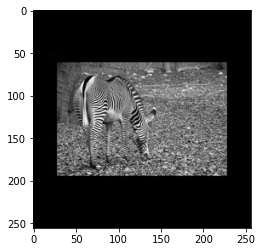

Original


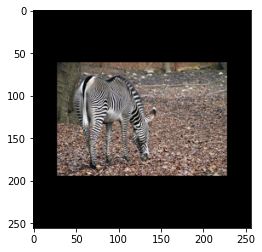

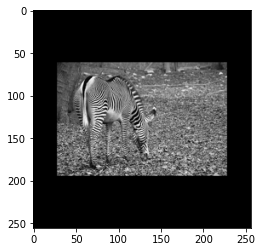

Attempt at Reconstruction


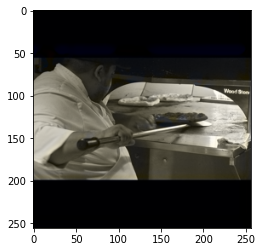

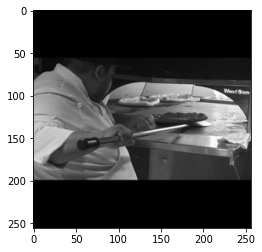

Original


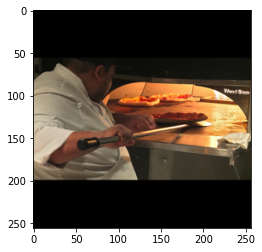

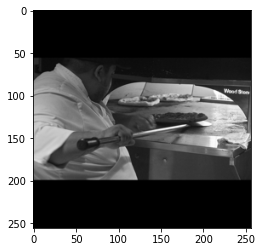

Attempt at Reconstruction


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


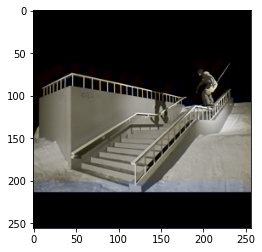

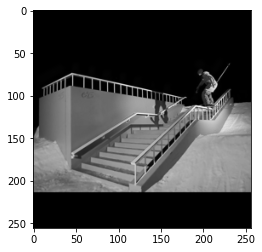

Original


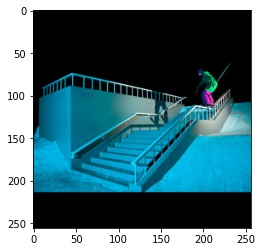

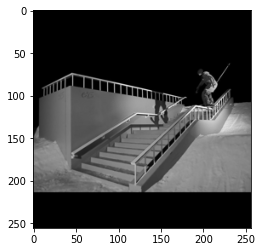

Attempt at Reconstruction


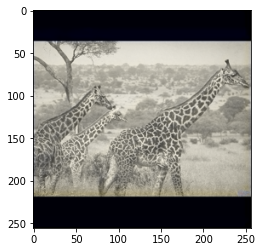

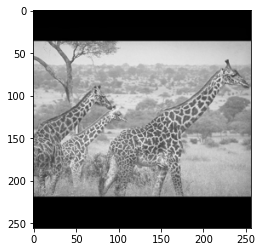

Original


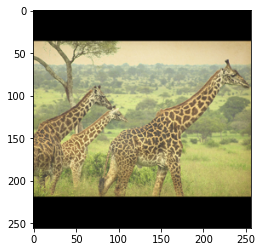

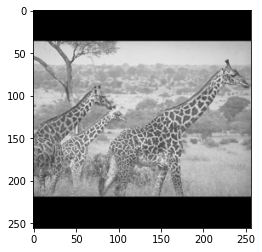

Attempt at Reconstruction


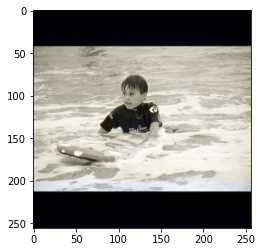

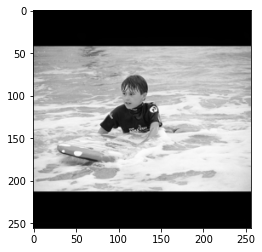

Original


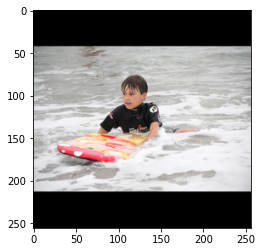

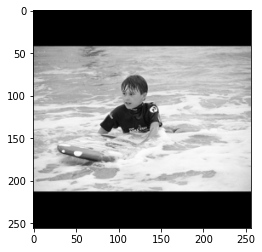

Attempt at Reconstruction


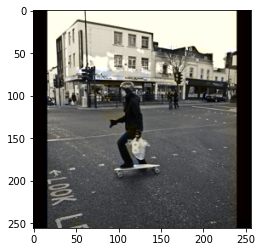

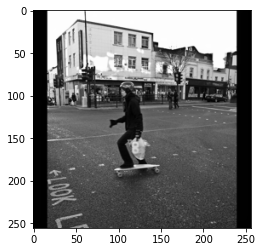

Original


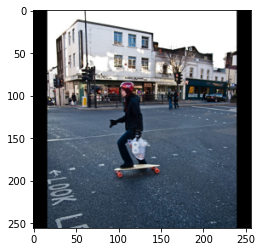

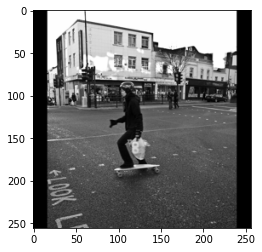

Attempt at Reconstruction


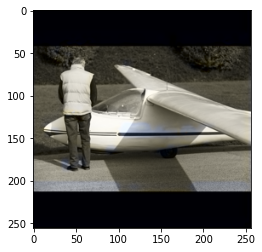

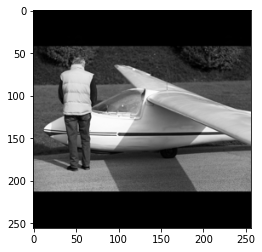

Original


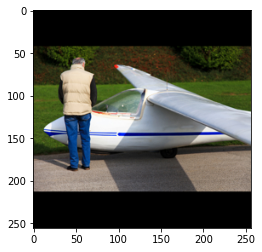

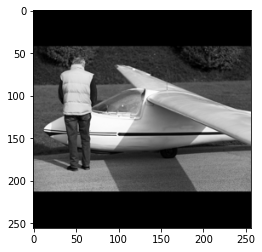

In [ ]:
train_loader, val_loader = split_data('/content/small_dataset', 1)

for inputs, labels in train_loader:
  inputs = inputs.cuda()
  labels = labels.cuda()
  logits = model(inputs)
  print("Attempt at Reconstruction")
  to_rgb(inputs.cpu()[0], logits.cpu().detach().numpy()[0])
  print("Original")
  to_rgb(inputs.cpu()[0], labels.cpu()[0])

In [ ]:
test_transforms = transforms.Compose([transforms.ToTensor(),transforms.Resize((128,128)),transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])
test_imagefolder = MockData("/content/small_dataset" + '/test' , test_transforms)
test_loader = torch.utils.data.DataLoader(test_imagefolder, batch_size=1, shuffle=False)
model = colorizer()
model.load_state_dict(torch.load("/content/backup/bs32_lr0.01_epoch50/bs32_lr0.01_epoch20"))
model.eval()
for i, (image,labels) in enumerate(test_loader):
      #print(labels.shape)
      logits = model(image)
      to_rgb(image[i].cpu(), ab_input=logits[i].detach().cpu())

      #plot = plt.plot([image,logits[:1,:,:],logits[1:2,:,:]])
      #plt.imshow()